In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import os
import json
import random
from pathlib import Path
from collections import Counter

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from PIL import Image, ImageDraw

In [4]:
DATASET_PATH=Path("/content/drive/MyDrive/material_version")

In [5]:
TRAIN_DIR=DATASET_PATH/"train"
VAL_DIR=DATASET_PATH/"val"

TRAIN_JSON=DATASET_PATH/"instances_train_trashcan.json"
VAL_JSON=DATASET_PATH/"instances_val_trashcan.json"

In [6]:
print("Dataset path:",DATASET_PATH)
print("Train folder exists:",TRAIN_DIR.exists())
print("Validation folder exists:",VAL_DIR.exists())
print("Train JSON exists:",TRAIN_JSON.exists())
print("Validation JSON exists:",VAL_JSON.exists())

Dataset path: /content/drive/MyDrive/material_version
Train folder exists: True
Validation folder exists: True
Train JSON exists: True
Validation JSON exists: True


In [7]:
image_extensions={".jpg",".jpeg",".png",".JPG",".JPEG",".PNG"}

train_images=[
    p for p in TRAIN_DIR.rglob("*")
    if p.is_file() and p.suffix in image_extensions
]

val_images=[
    p for p in VAL_DIR.rglob("*")
    if p.is_file() and p.suffix in image_extensions
]

print("Train images:",len(train_images))
print("Validation images:",len(val_images))
print("Total images:",len(train_images)+len(val_images))

Train images: 6027
Validation images: 1205
Total images: 7232


In [8]:
with open(TRAIN_JSON,"r") as f:
    train_data=json.load(f)

with open(VAL_JSON,"r") as f:
    val_data=json.load(f)

print("Train JSON sections:",train_data.keys())
print("Val JSON sections:",val_data.keys())

Train JSON sections: dict_keys(['info', 'licenses', 'images', 'annotations', 'categories'])
Val JSON sections: dict_keys(['info', 'licenses', 'images', 'annotations', 'categories'])


In [9]:
print("TRAIN")
print("Images in JSON:",len(train_data["images"]))
print("Annotations:",len(train_data["annotations"]))
print("Categories:",len(train_data["categories"]))

print()

print("VALIDATION")
print("Images in JSON:",len(val_data["images"]))
print("Annotations:",len(val_data["annotations"]))
print("Categories:",len(val_data["categories"]))

TRAIN
Images in JSON: 6008
Annotations: 9741
Categories: 16

VALIDATION
Images in JSON: 1204
Annotations: 2595
Categories: 16


In [10]:
categories=pd.DataFrame(train_data["categories"])

print(categories[["id","name"]].to_string(index=False))

 id               name
  1                rov
  2              plant
  3        animal_fish
  4    animal_starfish
  5      animal_shells
  6        animal_crab
  7         animal_eel
  8         animal_etc
  9          trash_etc
 10       trash_fabric
 11 trash_fishing_gear
 12        trash_metal
 13        trash_paper
 14      trash_plastic
 15       trash_rubber
 16         trash_wood


In [11]:
category_map=dict(zip(categories["id"],categories["name"]))

print(category_map)

{1: 'rov', 2: 'plant', 3: 'animal_fish', 4: 'animal_starfish', 5: 'animal_shells', 6: 'animal_crab', 7: 'animal_eel', 8: 'animal_etc', 9: 'trash_etc', 10: 'trash_fabric', 11: 'trash_fishing_gear', 12: 'trash_metal', 13: 'trash_paper', 14: 'trash_plastic', 15: 'trash_rubber', 16: 'trash_wood'}


In [12]:
json_train_names={img["file_name"] for img in train_data["images"]}
json_val_names={img["file_name"] for img in val_data["images"]}

In [13]:
actual_train_names={p.name for p in train_images}
actual_val_names={p.name for p in val_images}

In [14]:
print("Train images in folder but not JSON:",
      len(actual_train_names-json_train_names))

print("Train images in JSON but not folder:",
      len(json_train_names-actual_train_names))

print("Validation images in folder but not JSON:",
      len(actual_val_names-json_val_names))

print("Validation images in JSON but not folder:",
      len(json_val_names-actual_val_names))

Train images in folder but not JSON: 19
Train images in JSON but not folder: 0
Validation images in folder but not JSON: 1
Validation images in JSON but not folder: 0


In [15]:
extra_train=sorted(actual_train_names-json_train_names)
extra_val=sorted(actual_val_names-json_val_names)

print("Extra train images:")
for name in extra_train:
    print(name)

print("\nExtra validation images:")
for name in extra_val:
    print(name)

Extra train images:
vid_000085_frame0000042 (1).jpg
vid_000086_frame0000021 (1).jpg
vid_000086_frame0000026 (1).jpg
vid_000141_frame0000016 (1).jpg
vid_000141_frame0000017 (1).jpg
vid_000142_frame0000001 (1).jpg
vid_000142_frame0000002 (1).jpg
vid_000142_frame0000003 (1).jpg
vid_000142_frame0000004 (1).jpg
vid_000142_frame0000005 (1).jpg
vid_000142_frame0000006 (1).jpg
vid_000142_frame0000007 (1).jpg
vid_000142_frame0000008 (1).jpg
vid_000142_frame0000009 (1).jpg
vid_000142_frame0000010 (1).jpg
vid_000142_frame0000011 (1).jpg
vid_000142_frame0000012 (1).jpg
vid_000142_frame0000013 (1).jpg
vid_000142_frame0000014 (1).jpg

Extra validation images:
vid_000127_frame0000045 (1).jpg


In [16]:
train_json_filenames=[
    img["file_name"]
    for img in train_data["images"]
]

val_json_filenames=[
    img["file_name"]
    for img in val_data["images"]
]

print("Extra train:")
for name in extra_train:
    matches=[x for x in train_json_filenames if Path(x).name==name]
    print(name,"->",matches)

print("\nExtra validation:")
for name in extra_val:
    matches=[x for x in val_json_filenames if Path(x).name==name]
    print(name,"->",matches)

Extra train:
vid_000085_frame0000042 (1).jpg -> []
vid_000086_frame0000021 (1).jpg -> []
vid_000086_frame0000026 (1).jpg -> []
vid_000141_frame0000016 (1).jpg -> []
vid_000141_frame0000017 (1).jpg -> []
vid_000142_frame0000001 (1).jpg -> []
vid_000142_frame0000002 (1).jpg -> []
vid_000142_frame0000003 (1).jpg -> []
vid_000142_frame0000004 (1).jpg -> []
vid_000142_frame0000005 (1).jpg -> []
vid_000142_frame0000006 (1).jpg -> []
vid_000142_frame0000007 (1).jpg -> []
vid_000142_frame0000008 (1).jpg -> []
vid_000142_frame0000009 (1).jpg -> []
vid_000142_frame0000010 (1).jpg -> []
vid_000142_frame0000011 (1).jpg -> []
vid_000142_frame0000012 (1).jpg -> []
vid_000142_frame0000013 (1).jpg -> []
vid_000142_frame0000014 (1).jpg -> []

Extra validation:
vid_000127_frame0000045 (1).jpg -> []


In [52]:
from PIL import Image
import hashlib

def file_hash(path):
    h=hashlib.md5()
    with open(path,"rb") as f:
        h.update(f.read())
    return h.hexdigest()

train_hashes={}

for file in train_images:
    train_hashes.setdefault(file_hash(file),[]).append(file)

duplicate_groups=[
    files for files in train_hashes.values()
    if len(files)>1
]

print("Duplicate groups:",len(duplicate_groups))

for group in duplicate_groups[:20]:
    print("\n")
    for file in group:
        print(file.name)

Duplicate groups: 19


vid_000142_frame0000014 (1).jpg
vid_000142_frame0000014.jpg


vid_000142_frame0000006 (1).jpg
vid_000142_frame0000006.jpg


vid_000142_frame0000008 (1).jpg
vid_000142_frame0000008.jpg


vid_000142_frame0000007 (1).jpg
vid_000142_frame0000007.jpg


vid_000142_frame0000010 (1).jpg
vid_000142_frame0000010.jpg


vid_000142_frame0000005 (1).jpg
vid_000142_frame0000005.jpg


vid_000142_frame0000012 (1).jpg
vid_000142_frame0000012.jpg


vid_000142_frame0000013 (1).jpg
vid_000142_frame0000013.jpg


vid_000142_frame0000011 (1).jpg
vid_000142_frame0000011.jpg


vid_000142_frame0000009 (1).jpg
vid_000142_frame0000009.jpg


vid_000086_frame0000021 (1).jpg
vid_000086_frame0000021.jpg


vid_000142_frame0000004 (1).jpg
vid_000142_frame0000004.jpg


vid_000085_frame0000042 (1).jpg
vid_000085_frame0000042.jpg


vid_000086_frame0000026 (1).jpg
vid_000086_frame0000026.jpg


vid_000142_frame0000002 (1).jpg
vid_000142_frame0000002.jpg


vid_000142_frame0000003 (1).jpg
vid_000142_fram

In [17]:
train_json_filenames=[
    img["file_name"]
    for img in train_data["images"]
]

val_json_filenames=[
    img["file_name"]
    for img in val_data["images"]
]

print("Extra train:")
for name in extra_train:
    matches=[x for x in train_json_filenames if Path(x).name==name]
    print(name,"->",matches)

print("\nExtra validation:")
for name in extra_val:
    matches=[x for x in val_json_filenames if Path(x).name==name]
    print(name,"->",matches)

Extra train:
vid_000085_frame0000042 (1).jpg -> []
vid_000086_frame0000021 (1).jpg -> []
vid_000086_frame0000026 (1).jpg -> []
vid_000141_frame0000016 (1).jpg -> []
vid_000141_frame0000017 (1).jpg -> []
vid_000142_frame0000001 (1).jpg -> []
vid_000142_frame0000002 (1).jpg -> []
vid_000142_frame0000003 (1).jpg -> []
vid_000142_frame0000004 (1).jpg -> []
vid_000142_frame0000005 (1).jpg -> []
vid_000142_frame0000006 (1).jpg -> []
vid_000142_frame0000007 (1).jpg -> []
vid_000142_frame0000008 (1).jpg -> []
vid_000142_frame0000009 (1).jpg -> []
vid_000142_frame0000010 (1).jpg -> []
vid_000142_frame0000011 (1).jpg -> []
vid_000142_frame0000012 (1).jpg -> []
vid_000142_frame0000013 (1).jpg -> []
vid_000142_frame0000014 (1).jpg -> []

Extra validation:
vid_000127_frame0000045 (1).jpg -> []


In [18]:
img=Image.open(train_images[0])

print("File:",train_images[0])
print("Size:",img.size)
print("Mode:",img.mode)

File: /content/drive/MyDrive/material_version/train/vid_000285_frame0000165.jpg
Size: (480, 360)
Mode: RGB


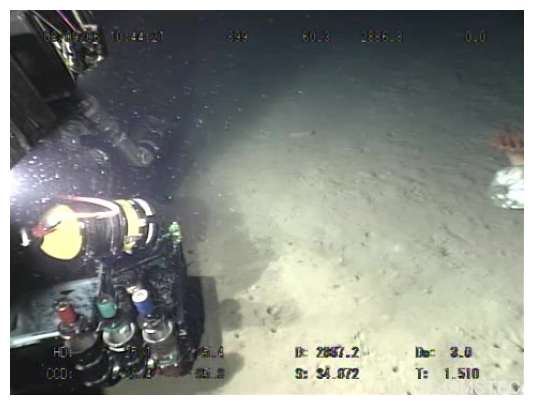

In [19]:
plt.figure(figsize=(8,5))
plt.imshow(img)
plt.axis("off")
plt.show()

In [20]:
train_resolutions=[]

for file in train_images:
    with Image.open(file) as img:
        train_resolutions.append(img.size)

resolution_counts=Counter(train_resolutions)

print("Training resolutions:")
for resolution,count in resolution_counts.items():
    print(resolution,":",count)

Training resolutions:
(480, 360) : 3008
(480, 270) : 3019


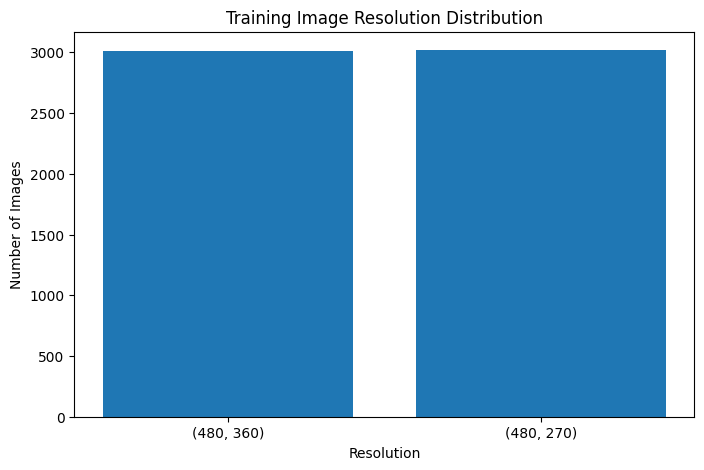

In [21]:
plt.figure(figsize=(8,5))

plt.bar(
    [str(x) for x in resolution_counts.keys()],
    resolution_counts.values()
)

plt.xlabel("Resolution")
plt.ylabel("Number of Images")
plt.title("Training Image Resolution Distribution")

plt.show()

In [22]:
val_resolutions=[]

for file in val_images:
    with Image.open(file) as img:
        val_resolutions.append(img.size)

val_resolution_counts=Counter(val_resolutions)

print("Validation resolutions:")
for resolution,count in val_resolution_counts.items():
    print(resolution,":",count)

Validation resolutions:
(480, 360) : 237
(480, 270) : 968


In [23]:
train_annotations=pd.DataFrame(train_data["annotations"])

train_annotations["category_name"]=train_annotations["category_id"].map(category_map)

train_annotations.head()

,segmentation,area,iscrowd,image_id,bbox,category_id,id,category_name
0,"[[240.0, 343.99468085106383, 250.0, 339.98, 25...",16229.084789,0,1,"[135.00375939849624, 157.00387596899225, 155.9...",8,1,animal_etc
1,"[[429.0, 316.9980392156863, 432.9980392156863,...",15166.853937,0,2,"[1.0019607843137255, 171.00196078431372, 476.9...",2,2,plant
2,"[[254.0, 282.9959677419355, 257.9891304347826,...",721.006669,0,2,"[233.00833333333333, 252.0040322580645, 38.986...",4,3,animal_starfish
3,"[[292.0, 275.9932432432432, 296.9916666666667,...",665.874352,0,2,"[270.03125, 246.00342465753425, 39.96199324324...",4,4,animal_starfish
4,"[[14.0, 263.96875, 21.0, 256.99792531120335, 2...",616.742405,0,2,"[5.004464285714286, 238.00409836065575, 34.979...",4,5,animal_starfish


In [24]:
print(train_annotations.columns.tolist())

['segmentation', 'area', 'iscrowd', 'image_id', 'bbox', 'category_id', 'id', 'category_name']


In [25]:
class_counts=train_annotations["category_name"].value_counts()

print(class_counts)

category_name
rov                   2653
trash_etc             1630
trash_plastic         1490
trash_metal            901
animal_fish            611
plant                  405
animal_starfish        274
trash_wood             271
animal_eel             267
trash_fabric           247
animal_crab            247
animal_etc             180
animal_shells          171
trash_paper            154
trash_fishing_gear     127
trash_rubber           113
Name: count, dtype: int64


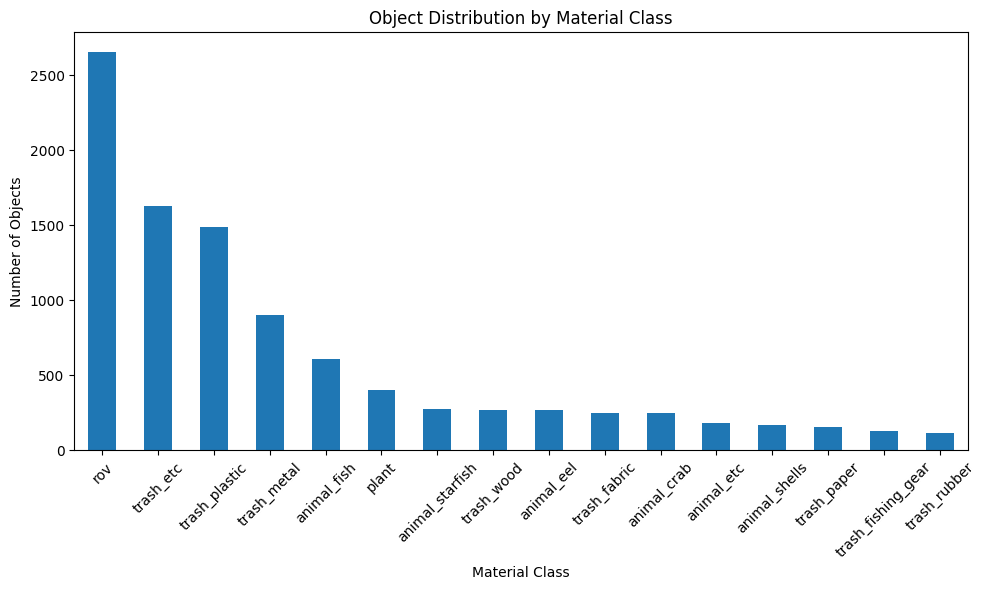

In [26]:
plt.figure(figsize=(10,6))

class_counts.sort_values(ascending=False).plot(kind="bar")

plt.xlabel("Material Class")
plt.ylabel("Number of Objects")
plt.title("Object Distribution by Material Class")

plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

In [27]:
images_per_class=train_annotations.groupby("category_name")["image_id"].nunique()

print(images_per_class)

category_name
animal_crab            146
animal_eel             185
animal_etc             176
animal_fish            543
animal_shells           99
animal_starfish         87
plant                  384
rov                   2241
trash_etc             1439
trash_fabric           213
trash_fishing_gear     110
trash_metal            879
trash_paper            129
trash_plastic         1412
trash_rubber           113
trash_wood             257
Name: image_id, dtype: int64


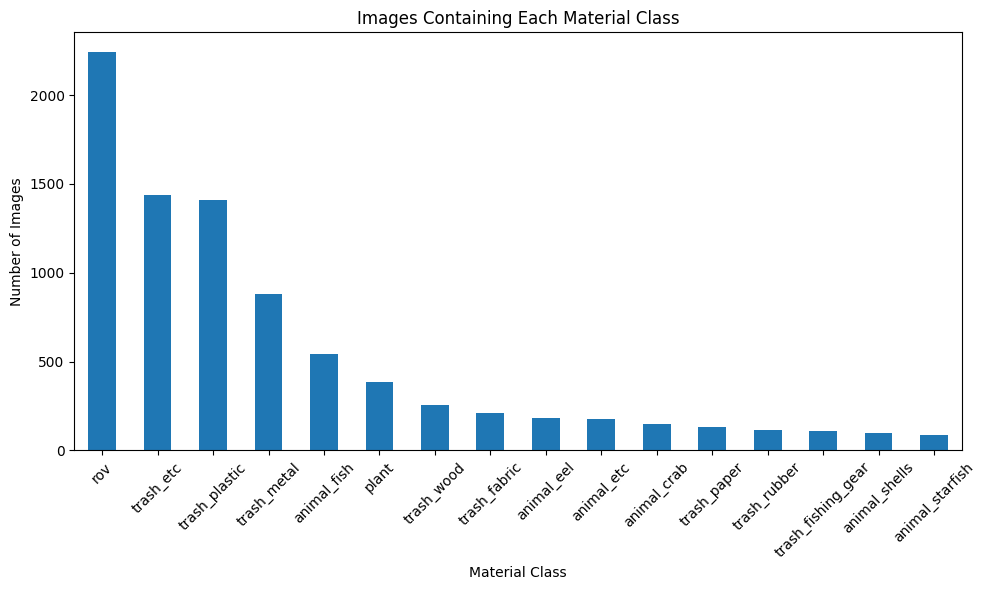

In [28]:
plt.figure(figsize=(10,6))

images_per_class.sort_values(ascending=False).plot(kind="bar")

plt.xlabel("Material Class")
plt.ylabel("Number of Images")
plt.title("Images Containing Each Material Class")

plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

In [29]:
objects_per_image=train_annotations.groupby("image_id").size()

print(objects_per_image.describe())

count    6008.000000
mean        1.621338
std         1.175717
min         1.000000
25%         1.000000
50%         1.000000
75%         2.000000
max        19.000000
dtype: float64


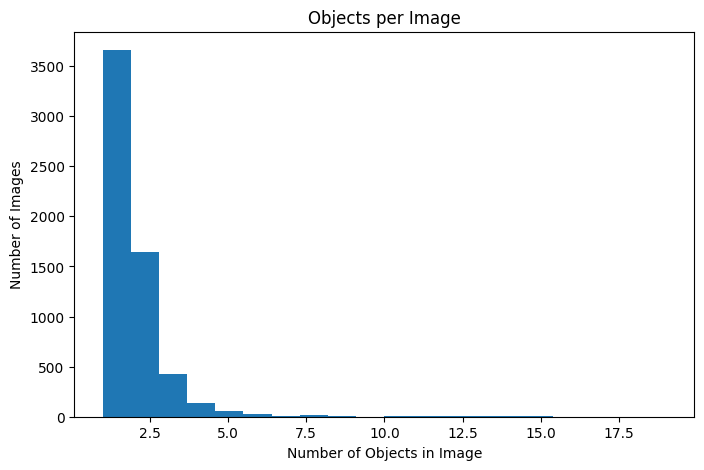

In [30]:
plt.figure(figsize=(8,5))

plt.hist(objects_per_image,bins=20)

plt.xlabel("Number of Objects in Image")
plt.ylabel("Number of Images")
plt.title("Objects per Image")

plt.show()

In [31]:
train_annotations["bbox_width"]=train_annotations["bbox"].apply(lambda x:x[2])
train_annotations["bbox_height"]=train_annotations["bbox"].apply(lambda x:x[3])

train_annotations["bbox_area"]=(
    train_annotations["bbox_width"]*
    train_annotations["bbox_height"]
)

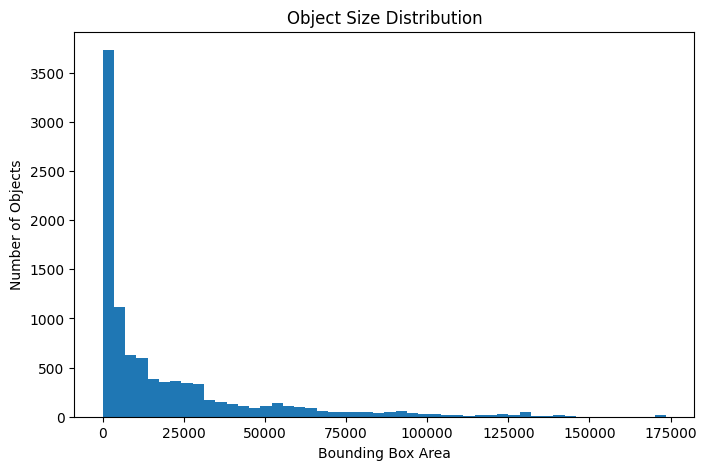

In [32]:
plt.figure(figsize=(8,5))

plt.hist(train_annotations["bbox_area"],bins=50)

plt.xlabel("Bounding Box Area")
plt.ylabel("Number of Objects")
plt.title("Object Size Distribution")

plt.show()

In [33]:
image_sizes={
    img["id"]:(img["width"],img["height"])
    for img in train_data["images"]
}

In [34]:
def relative_area(row):
    width,height=image_sizes[row["image_id"]]
    return row["bbox_area"]/(width*height)

train_annotations["relative_bbox_area"]=train_annotations.apply(
    relative_area,
    axis=1
)

In [35]:
print(train_annotations["relative_bbox_area"].describe())

count    9741.000000
mean        0.130135
std         0.185890
min         0.000069
25%         0.011880
50%         0.047888
75%         0.173142
max         1.005772
Name: relative_bbox_area, dtype: float64


In [36]:
small_objects=train_annotations[
    train_annotations["relative_bbox_area"]<0.01
]

print("Objects occupying less than 1% of image:",
      len(small_objects))

Objects occupying less than 1% of image: 2084


In [37]:
percentage_small=(
    len(small_objects)/len(train_annotations)*100
)

print(f"Percentage of small objects: {percentage_small:.2f}%")

Percentage of small objects: 21.39%


In [39]:
brightness_values=[]

for file in train_images:
    with Image.open(file) as img:
        gray=np.array(img.convert("L"))
        brightness_values.append(gray.mean())

In [40]:
brightness_series=pd.Series(brightness_values)
print(brightness_series.describe())

count    6027.000000
mean       94.551295
std        34.866605
min        10.050498
25%        71.166918
50%        90.566829
75%       115.342608
max       223.188397
dtype: float64


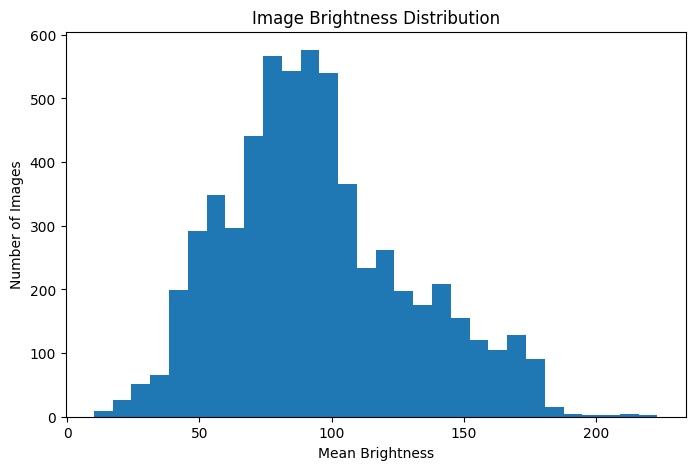

In [41]:
plt.figure(figsize=(8,5))

plt.hist(brightness_values,bins=30)

plt.xlabel("Mean Brightness")
plt.ylabel("Number of Images")
plt.title("Image Brightness Distribution")

plt.show()

In [42]:
contrast_values=[]

for file in train_images:
    with Image.open(file) as img:
        gray=np.array(img.convert("L"))
        contrast_values.append(gray.std())

In [43]:
contrast_series=pd.Series(contrast_values)

print(contrast_series.describe())

count    6027.000000
mean       38.107579
std        14.671352
min        11.108543
25%        26.106705
50%        36.012618
75%        47.558041
max        92.135901
dtype: float64


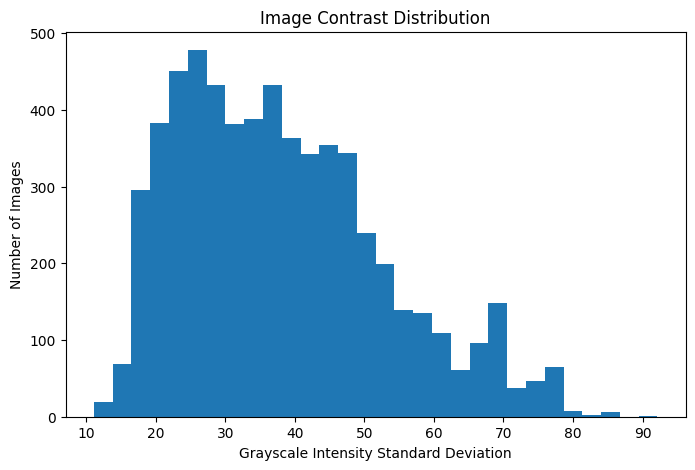

In [44]:
plt.figure(figsize=(8,5))

plt.hist(contrast_values,bins=30)

plt.xlabel("Grayscale Intensity Standard Deviation")
plt.ylabel("Number of Images")
plt.title("Image Contrast Distribution")

plt.show()

In [45]:
brightness_df=pd.DataFrame({
    "file":train_images,
    "brightness":brightness_values
})

brightness_df=brightness_df.sort_values("brightness")

In [46]:
brightness_df.head(10)

,file,brightness
1065,/content/drive/MyDrive/material_version/train/...,10.050498
1366,/content/drive/MyDrive/material_version/train/...,10.994977
1470,/content/drive/MyDrive/material_version/train/...,11.966742
1201,/content/drive/MyDrive/material_version/train/...,12.993409
1149,/content/drive/MyDrive/material_version/train/...,15.812552
1370,/content/drive/MyDrive/material_version/train/...,15.908339
1136,/content/drive/MyDrive/material_version/train/...,16.182396
4174,/content/drive/MyDrive/material_version/train/...,16.397853
4427,/content/drive/MyDrive/material_version/train/...,16.540336
1699,/content/drive/MyDrive/material_version/train/...,17.597216


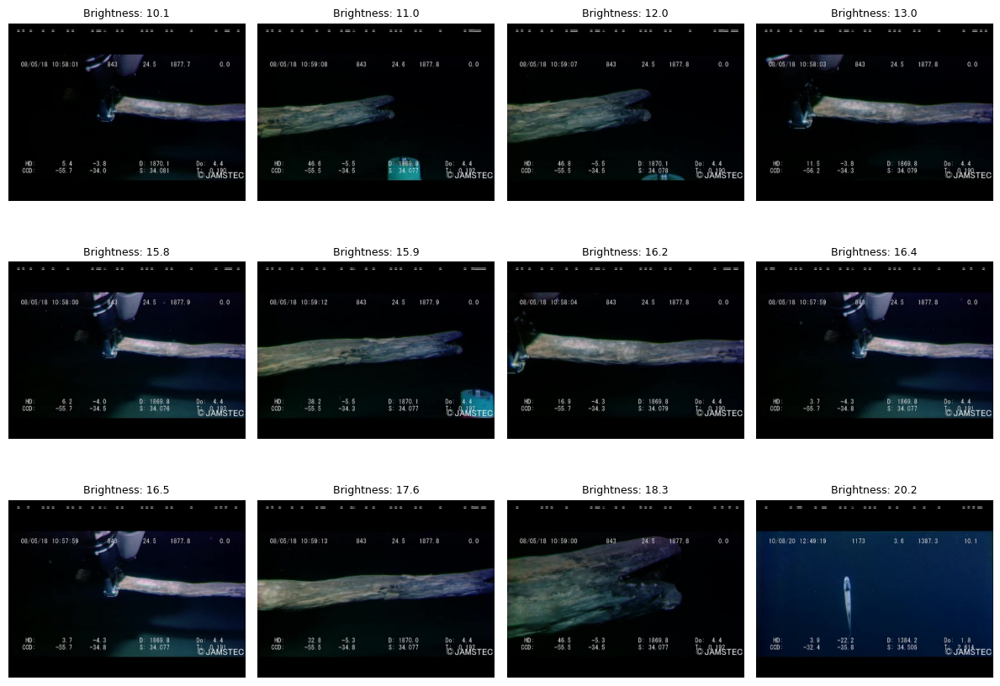

In [47]:
dark_images=brightness_df.head(12)

fig,axes=plt.subplots(3,4,figsize=(12,9))

for ax,(_,row) in zip(axes.flat,dark_images.iterrows()):
    img=Image.open(row["file"])

    ax.imshow(img)
    ax.set_title(
        f"Brightness: {row['brightness']:.1f}",
        fontsize=9
    )
    ax.axis("off")

plt.tight_layout()
plt.show()

In [48]:
contrast_df=pd.DataFrame({
    "file":train_images,
    "contrast":contrast_values
})

contrast_df=contrast_df.sort_values("contrast")

contrast_df.head(10)

,file,contrast
770,/content/drive/MyDrive/material_version/train/...,11.108543
5436,/content/drive/MyDrive/material_version/train/...,11.249486
700,/content/drive/MyDrive/material_version/train/...,11.258108
1185,/content/drive/MyDrive/material_version/train/...,11.892441
948,/content/drive/MyDrive/material_version/train/...,12.342734
2717,/content/drive/MyDrive/material_version/train/...,12.942612
2059,/content/drive/MyDrive/material_version/train/...,12.980283
3007,/content/drive/MyDrive/material_version/train/...,12.983896
615,/content/drive/MyDrive/material_version/train/...,13.003318
2831,/content/drive/MyDrive/material_version/train/...,13.020352


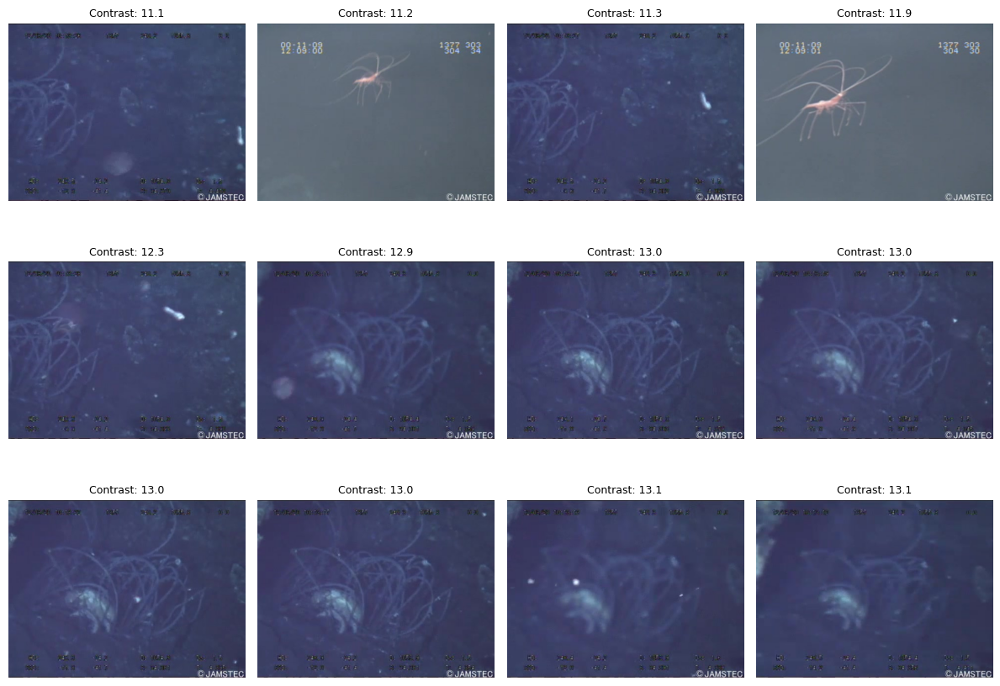

In [49]:
low_contrast_images=contrast_df.head(12)

fig,axes=plt.subplots(3,4,figsize=(12,9))

for ax,(_,row) in zip(axes.flat,low_contrast_images.iterrows()):
    img=Image.open(row["file"])

    ax.imshow(img)
    ax.set_title(
        f"Contrast: {row['contrast']:.1f}",
        fontsize=9
    )
    ax.axis("off")

plt.tight_layout()
plt.show()

In [50]:
random.seed(42)

sample_files=random.sample(
    train_images,
    min(12,len(train_images))
)

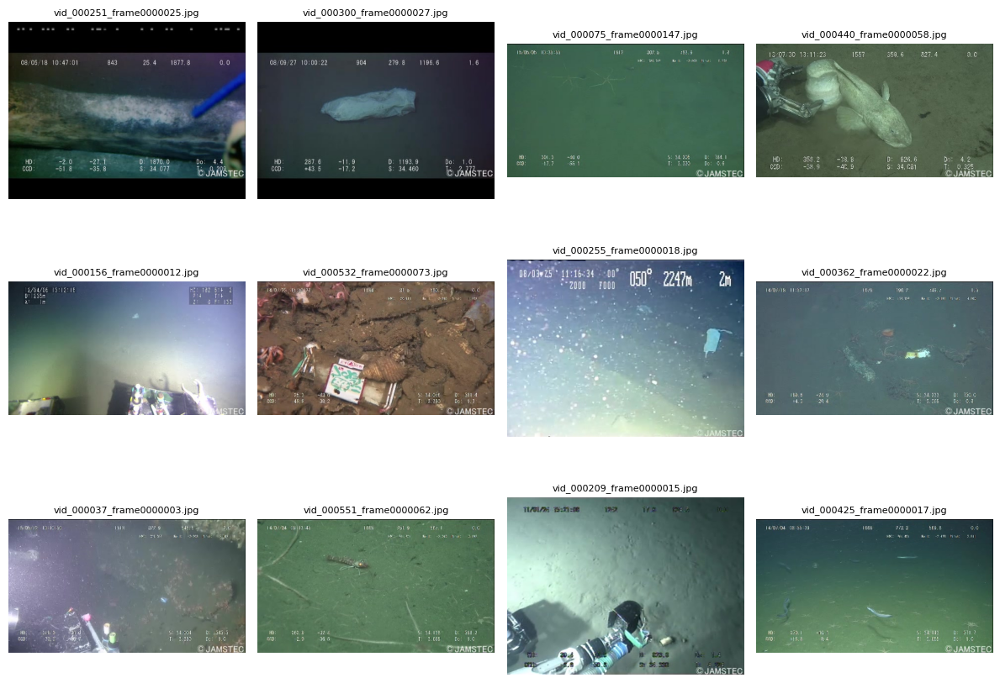

In [51]:
fig,axes=plt.subplots(3,4,figsize=(12,9))

for ax,file in zip(axes.flat,sample_files):
    img=Image.open(file)

    ax.imshow(img)
    ax.set_title(file.name,fontsize=8)
    ax.axis("off")

plt.tight_layout()
plt.show()

In [54]:
invalid_boxes=[]

for _,row in train_annotations.iterrows():

    image_id=row["image_id"]
    width,height=image_sizes[image_id]

    x,y,w,h=row["bbox"]

    if x<0 or y<0 or w<=0 or h<=0:
        invalid_boxes.append(
            (image_id,row["id"],row["bbox"],"invalid dimensions")
        )
        continue

    if x+w>width or y+h>height:
        invalid_boxes.append(
            (image_id,row["id"],row["bbox"],"outside image")
        )

print("Invalid/out-of-bound boxes:",len(invalid_boxes))

for item in invalid_boxes[:20]:
    print(item)

Invalid/out-of-bound boxes: 2699
(3, 6, [0.007246376811594203, 219.0076923076923, 478.9906168710516, 51.99034690799397], 'outside image')
(5, 10, [261.0019607843137, 113.00196078431372, 219.99607843137255, 108.99607843137255], 'outside image')
(7, 15, [317.0019607843137, 63.001960784313724, 163.99607843137255, 255.99607843137255], 'outside image')
(8, 17, [0.00196078431372549, 0.00196078431372549, 146.99607843137255, 360.99607843137255], 'outside image')
(12, 23, [170.00196078431372, 179.00196078431372, 217.99607843137255, 91.99607843137255], 'outside image')
(13, 24, [171.00196078431372, 172.00694444444446, 221.99607843137255, 98.99109477124182], 'outside image')
(21, 34, [67.00230414746544, 314.01666666666665, 316.993964509251, 46.981372549019625], 'outside image')
(24, 39, [245.00242718446603, 286.1666666666667, 235.99549812673732, 32.333333333333314], 'outside image')
(25, 41, [57.00268817204301, 57.00219298245614, 423.9794546850998, 273.976067887109], 'outside image')
(28, 45, [35

In [55]:
out_of_bounds=[]

for _,row in train_annotations.iterrows():
    image_id=row["image_id"]
    width,height=image_sizes[image_id]

    x,y,w,h=row["bbox"]
    right=x+w
    bottom=y+h

    overflow_right=max(0,right-width)
    overflow_bottom=max(0,bottom-height)

    if x<0 or y<0 or w<=0 or h<=0 or right>width or bottom>height:
        out_of_bounds.append({
            "image_id":image_id,
            "annotation_id":row["id"],
            "bbox":row["bbox"],
            "image_width":width,
            "image_height":height,
            "right":right,
            "bottom":bottom,
            "overflow_right":overflow_right,
            "overflow_bottom":overflow_bottom
        })

out_df=pd.DataFrame(out_of_bounds)

print("Total flagged:",len(out_df))
print(out_df[["overflow_right","overflow_bottom"]].describe())

Total flagged: 2699
       overflow_right  overflow_bottom
count     2699.000000      2699.000000
mean         0.388271         0.756967
std          0.485499         0.426274
min          0.000000         0.000000
25%          0.000000         0.984123
50%          0.000000         0.998039
75%          0.998016         0.998039
max          0.998039         0.998039


In [56]:
print("Overflow <= 1 pixel:",
      ((out_df["overflow_right"]<=1)&
       (out_df["overflow_bottom"]<=1)).sum())

print("Overflow <= 2 pixels:",
      ((out_df["overflow_right"]<=2)&
       (out_df["overflow_bottom"]<=2)).sum())

print("Overflow > 2 pixels:",
      ((out_df["overflow_right"]>2)|
       (out_df["overflow_bottom"]>2)).sum())

Overflow <= 1 pixel: 2699
Overflow <= 2 pixels: 2699
Overflow > 2 pixels: 0


In [57]:
negative_x=(train_annotations["bbox"].apply(lambda x:x[0])<0).sum()
negative_y=(train_annotations["bbox"].apply(lambda x:x[1])<0).sum()

nonpositive_w=(train_annotations["bbox"].apply(lambda x:x[2])<=0).sum()
nonpositive_h=(train_annotations["bbox"].apply(lambda x:x[3])<=0).sum()

print("Negative x:",negative_x)
print("Negative y:",negative_y)
print("Non-positive width:",nonpositive_w)
print("Non-positive height:",nonpositive_h)

Negative x: 0
Negative y: 0
Non-positive width: 0
Non-positive height: 0


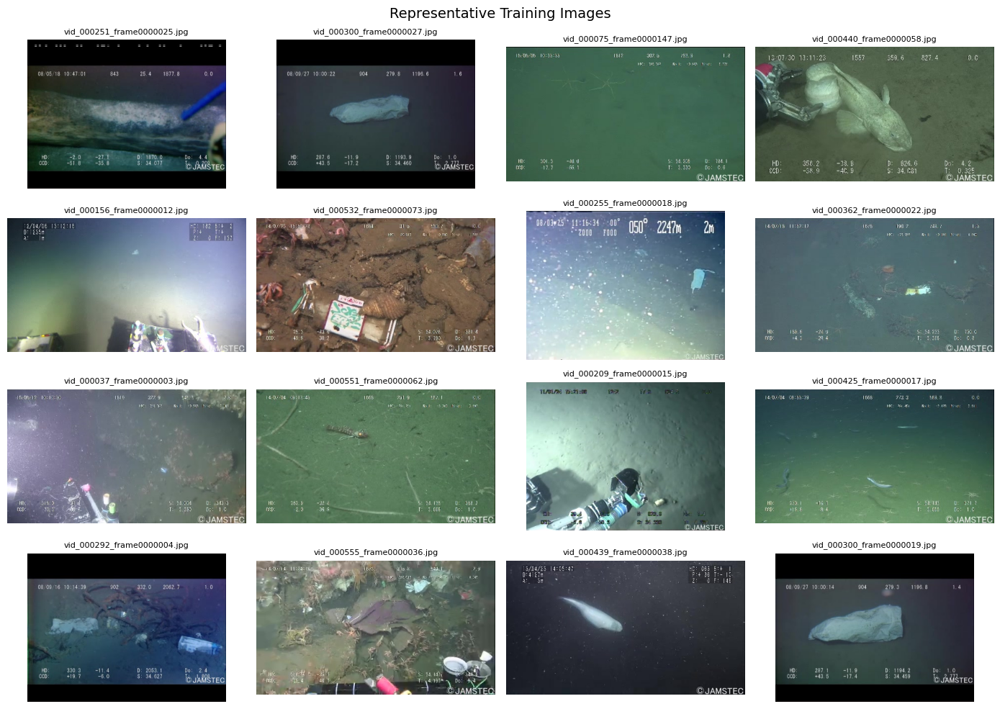

In [58]:
random.seed(42)

sample_files=random.sample(
    train_images,
    min(16,len(train_images))
)

fig,axes=plt.subplots(4,4,figsize=(14,10))

for ax,file in zip(axes.flat,sample_files):
    img=Image.open(file)

    ax.imshow(img)
    ax.set_title(file.name,fontsize=8)
    ax.axis("off")

for ax in axes.flat[len(sample_files):]:
    ax.axis("off")

plt.suptitle("Representative Training Images",fontsize=14)
plt.tight_layout()
plt.show()

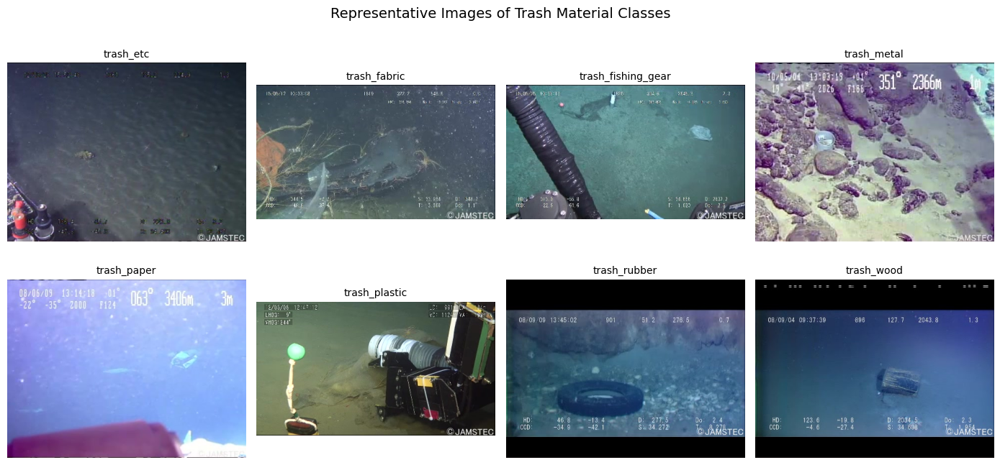

In [59]:
# Create one representative image for each trash material class

trash_classes=[
    "trash_etc",
    "trash_fabric",
    "trash_fishing_gear",
    "trash_metal",
    "trash_paper",
    "trash_plastic",
    "trash_rubber",
    "trash_wood"
]

image_id_to_file={
    img["id"]:TRAIN_DIR/img["file_name"]
    for img in train_data["images"]
}

class_examples={}

for cls in trash_classes:
    rows=train_annotations[
        train_annotations["category_name"]==cls
    ]

    if len(rows)>0:
        row=rows.sample(1,random_state=42).iloc[0]
        file=image_id_to_file[row["image_id"]]
        class_examples[cls]=file

fig,axes=plt.subplots(2,4,figsize=(14,7))

for ax,cls in zip(axes.flat,trash_classes):

    if cls in class_examples:
        img=Image.open(class_examples[cls])
        ax.imshow(img)
        ax.set_title(cls,fontsize=10)
    else:
        ax.set_title(cls+"\nNo sample")

    ax.axis("off")

plt.suptitle("Representative Images of Trash Material Classes",fontsize=14)
plt.tight_layout()
plt.show()

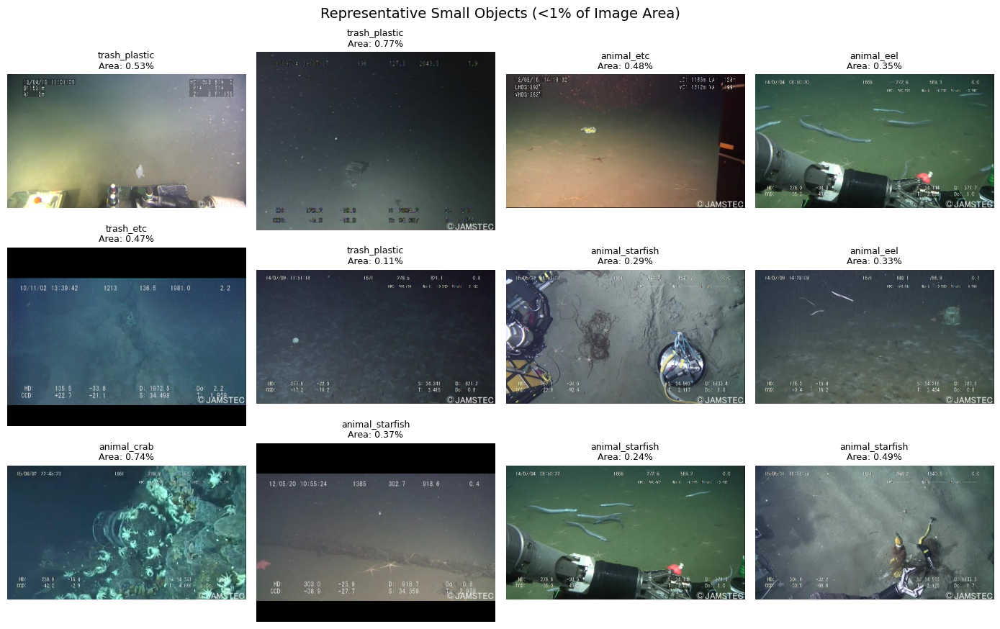

In [60]:
small_objects=train_annotations[
    train_annotations["relative_bbox_area"]<0.01
]

small_sample=small_objects.sample(
    min(12,len(small_objects)),
    random_state=42
)

fig,axes=plt.subplots(3,4,figsize=(14,9))

for ax,(_,row) in zip(axes.flat,small_sample.iterrows()):

    file=image_id_to_file[row["image_id"]]

    img=Image.open(file)

    ax.imshow(img)
    ax.set_title(
        f'{row["category_name"]}\n'
        f'Area: {row["relative_bbox_area"]*100:.2f}%',
        fontsize=9
    )
    ax.axis("off")

for ax in axes.flat[len(small_sample):]:
    ax.axis("off")

plt.suptitle(
    "Representative Small Objects (<1% of Image Area)",
    fontsize=14
)

plt.tight_layout()
plt.show()

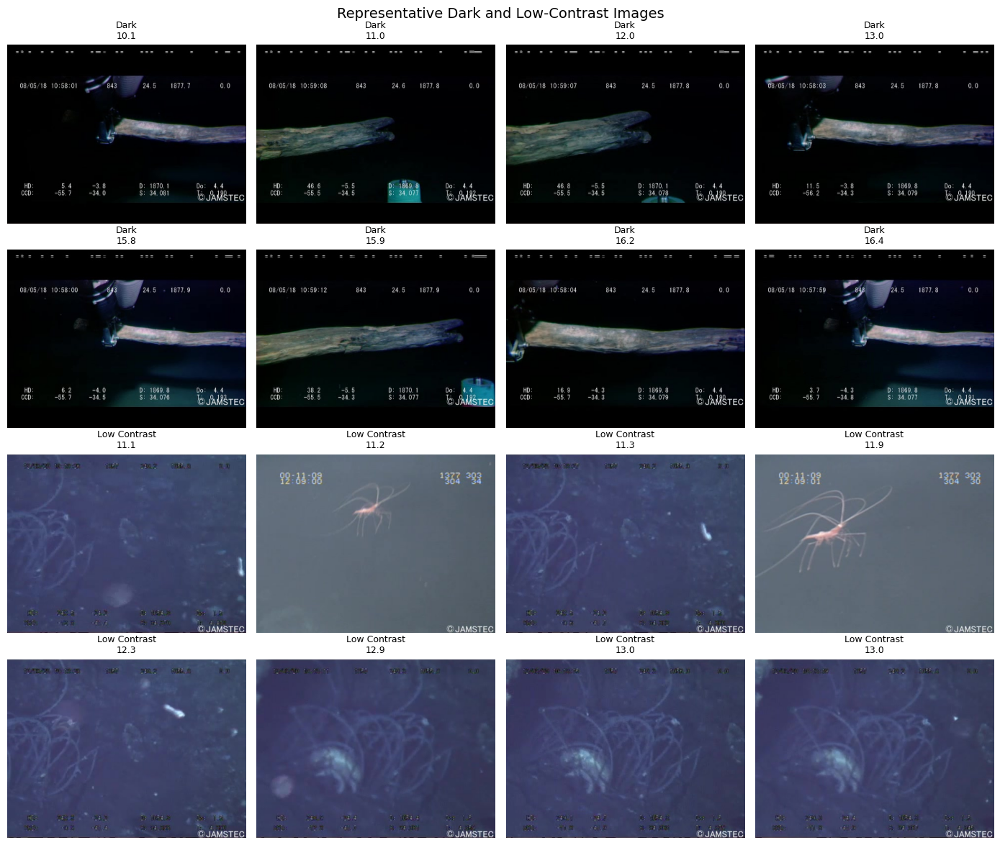

In [61]:
# Select the darkest and lowest-contrast images

darkest=brightness_df.head(8)

lowest_contrast=contrast_df.head(8)

fig,axes=plt.subplots(4,4,figsize=(14,12))

for ax,(_,row) in zip(axes.flat[:8],darkest.iterrows()):
    img=Image.open(row["file"])
    ax.imshow(img)
    ax.set_title(f"Dark\n{row['brightness']:.1f}",fontsize=9)
    ax.axis("off")

for ax,(_,row) in zip(axes.flat[8:],lowest_contrast.iterrows()):
    img=Image.open(row["file"])
    ax.imshow(img)
    ax.set_title(f"Low Contrast\n{row['contrast']:.1f}",fontsize=9)
    ax.axis("off")

plt.suptitle(
    "Representative Dark and Low-Contrast Images",
    fontsize=14
)

plt.tight_layout()
plt.show()

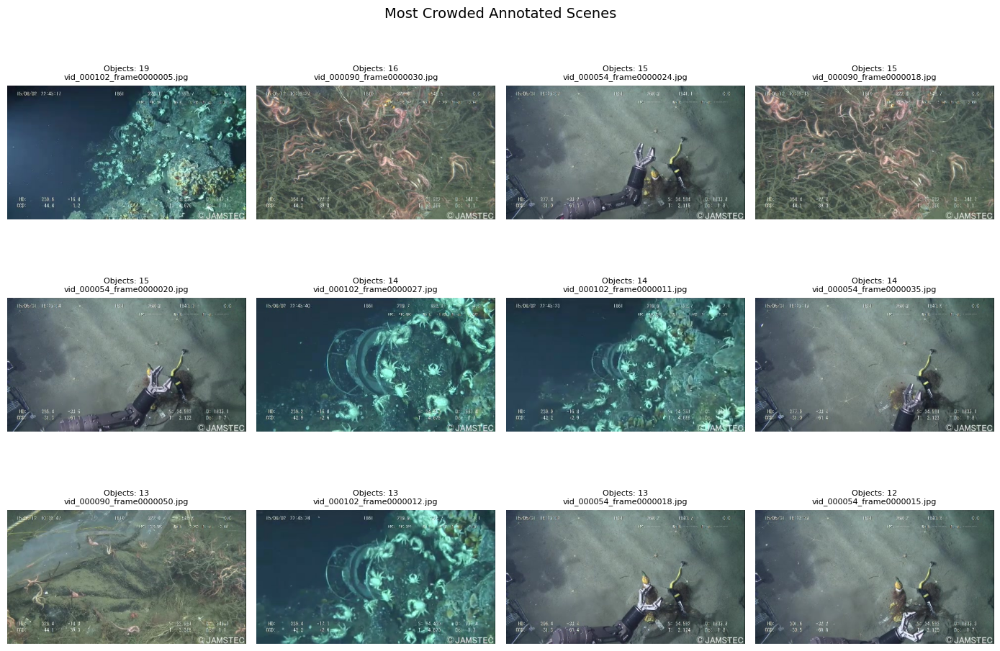

In [62]:
# Images with the highest number of annotated objects

objects_per_image=train_annotations.groupby("image_id").size()

crowded_ids=objects_per_image.sort_values(
    ascending=False
).head(12)

fig,axes=plt.subplots(3,4,figsize=(14,10))

for ax,image_id in zip(axes.flat,crowded_ids.index):

    file=image_id_to_file[image_id]
    img=Image.open(file)

    ax.imshow(img)
    ax.set_title(
        f"Objects: {objects_per_image[image_id]}\n{file.name}",
        fontsize=8
    )
    ax.axis("off")

plt.suptitle(
    "Most Crowded Annotated Scenes",
    fontsize=14
)

plt.tight_layout()
plt.show()

In [63]:
trash_classes=[
    "trash_etc",
    "trash_fabric",
    "trash_fishing_gear",
    "trash_metal",
    "trash_paper",
    "trash_plastic",
    "trash_rubber",
    "trash_wood"
]

train_annotations["group"]=train_annotations["category_name"].apply(
    lambda x:"trash" if x in trash_classes else "non-trash"
)

group_counts=train_annotations["group"].value_counts()

print(group_counts)

print()

print(
    (group_counts/group_counts.sum()*100).round(2)
)

group
trash        4933
non-trash    4808
Name: count, dtype: int64

group
trash        50.64
non-trash    49.36
Name: count, dtype: float64


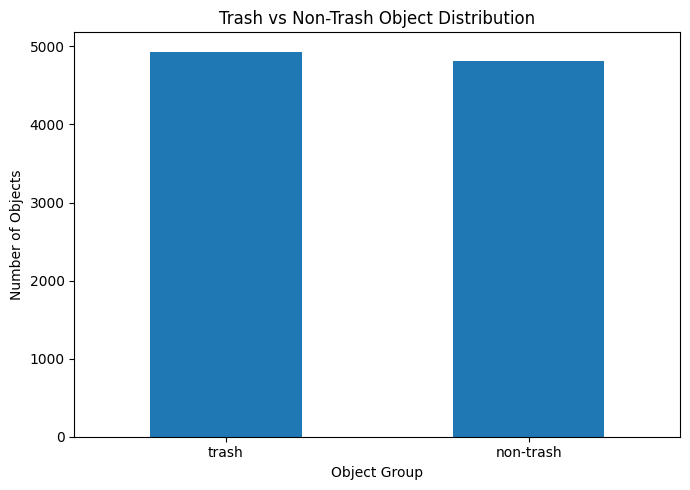

In [64]:
plt.figure(figsize=(7,5))

group_counts.plot(kind="bar")

plt.xlabel("Object Group")
plt.ylabel("Number of Objects")
plt.title("Trash vs Non-Trash Object Distribution")

plt.xticks(rotation=0)

plt.tight_layout()
plt.show()